# Learning Specification from User Demonstration on System

In this notebook, we're going to explore learning a known specification from demonstrations of the known specification on the product of the specification and a transition system model for a simple environment.

We will then apply the learned specification to an environment with a different robot / environmental dynamics, but with the same intended goal as in the environment where we demonstrated the task.

This shows that we can actually learn the intended task the user had in mind when they demonstrate it on a system with actual dynamics, and then apply that specification to a different environment.

Change up to the main repo directory:

In [1]:
import os
os.chdir(os.path.join('..', '..'))

In [2]:
%load_ext autoreload
%autoreload 2
import gym
from IPython.display import Video, display
from sklearn.model_selection import train_test_split

from wombats.systems import (StaticMinigridTSWrapper,
                             LavaComparison_noDryingOff)
from wombats.automaton import active_automata
from wombats.automaton import MinigridTransitionSystem
from wombats.learning import FlexfringeInterface
from wombats.automaton import Automaton
from wombats.utils import get_experiment_paths

# setting all paths
EXPERIMENT_NAME = 'MiniGrid_learning_from_product_samples'
ENV_ID = 'MiniGrid-LavaComparison_noDryingOff-v0'
# ENV_ID = 'MiniGrid-DistShift1-v0'
# ENV_ID = 'MiniGrid-LavaGapS5-v0'
# ENV_ID = 'MiniGrid-KeyCorridorS3R1-v0'

path_data = get_experiment_paths(EXPERIMENT_NAME)
EXPERIMENT_DIR = path_data['EXPERIMENT_DIR']
PDFA_MODEL_CONFIG_FILE = path_data['PDFA_MODEL_CONFIG_FILE']
LEARNER_DATA_DIR = path_data['LEARNER_DATA_DIR']
LEARNING_TRAIN_DATA_REL_FILEPATH = path_data['LEARNING_TRAIN_DATA_REL_FILEPATH']
GYM_MONITOR_LOG_DIR = path_data['GYM_MONITOR_LOG_DIR']

# reset the kernel's Automata class' experimental directory for all created
# Automaton objects.
#
# If you autoreload any code having to do with the automaton, then you will
# need to re-run this cell to get the right automaton data path back, as the
# reload will reset the base Automaton class' automata_data_dir property
Automaton.automata_data_dir = os.path.join(EXPERIMENT_DIR)

## Loading in the Desired LTL-style PDFA Specification

We're going to assume the user has some task in mind that can be expressed as some form of complicated LTL formula that has been translated to a DFA with probabilistic weights to encode their task preferences.

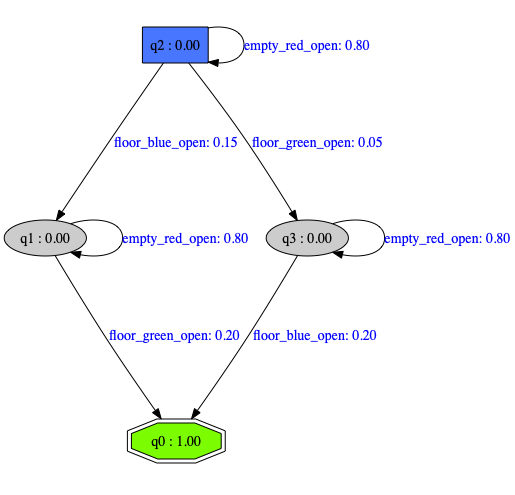

In [3]:
pdfa_specification = active_automata.get(automaton_type='PDFA',
                                         graph_data=PDFA_MODEL_CONFIG_FILE)

pdfa_specification.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'PDFA']))

## Loading in the Simplified Transition System for Demonstration

We are going to demonstrate this specification using a simplified robot that can only go in each cardinal direction

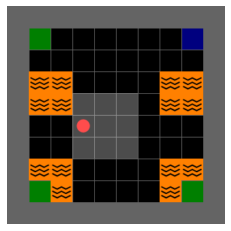

/Users/nicholasrenninger/Google Drive/Grad School/specification learning/code/DPFA_DTS_product_experiment/dfasatInvestigations/wombats/systems/minigrid.py:634: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


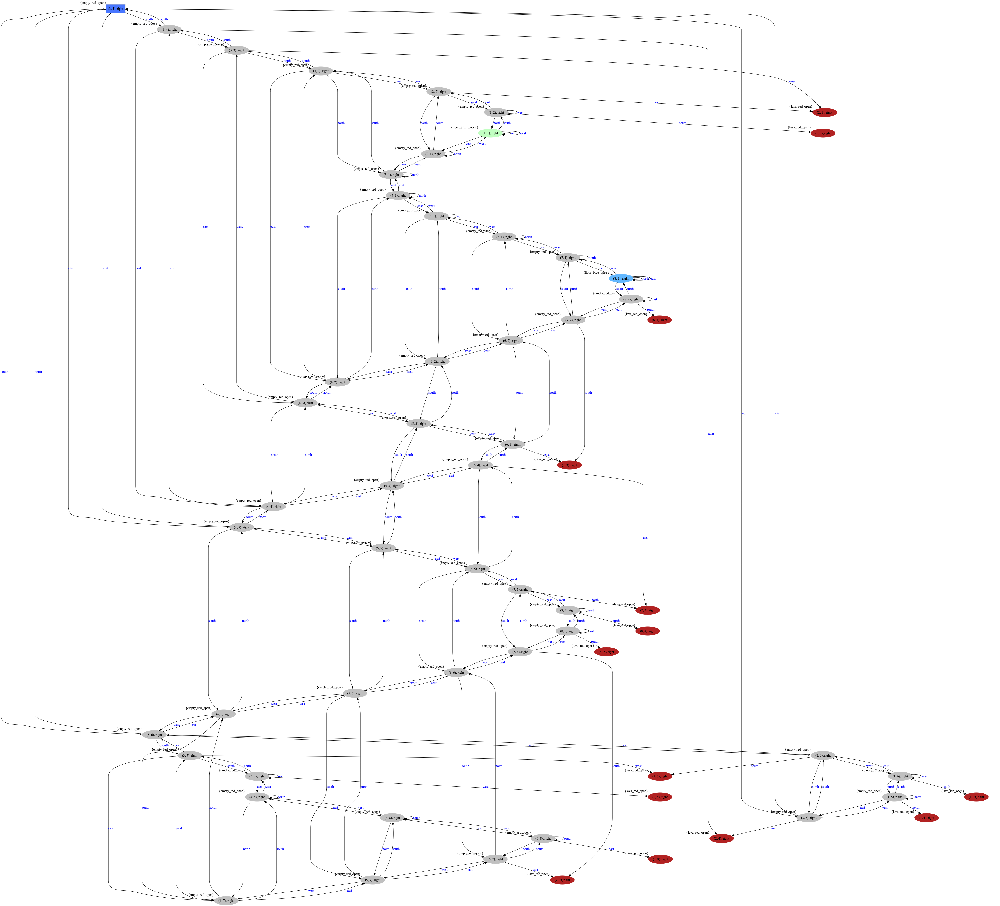

In [4]:
env = gym.make(ENV_ID)

env = StaticMinigridTSWrapper(env, actions_type='simple_static',
                              monitor_log_location=GYM_MONITOR_LOG_DIR)
env.reset()
env.render_notebook()

minigrid_TS = active_automata.get(automaton_type='TS', graph_data=env,
                                  graph_data_format='minigrid')
minigrid_TS.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'TS']))

In [5]:
minigrid_TS.observations

{'empty_red_open', 'floor_blue_open', 'floor_green_open', 'lava_red_open'}

In [6]:
list(minigrid_TS.actions)

[<SimpleStaticActions.north: 0>,
 <SimpleStaticActions.south: 1>,
 <SimpleStaticActions.east: 2>,
 <SimpleStaticActions.west: 3>]

## Generating Correct System Demonstrations

Here, we are now going to sample behavioral demonstrations of the robot in its environment that adhere to the given specification.

### Building the Product Automaton
To create demonstrations of the specification as applied to the simple robot & env. from above, we are going to start by taking their product 

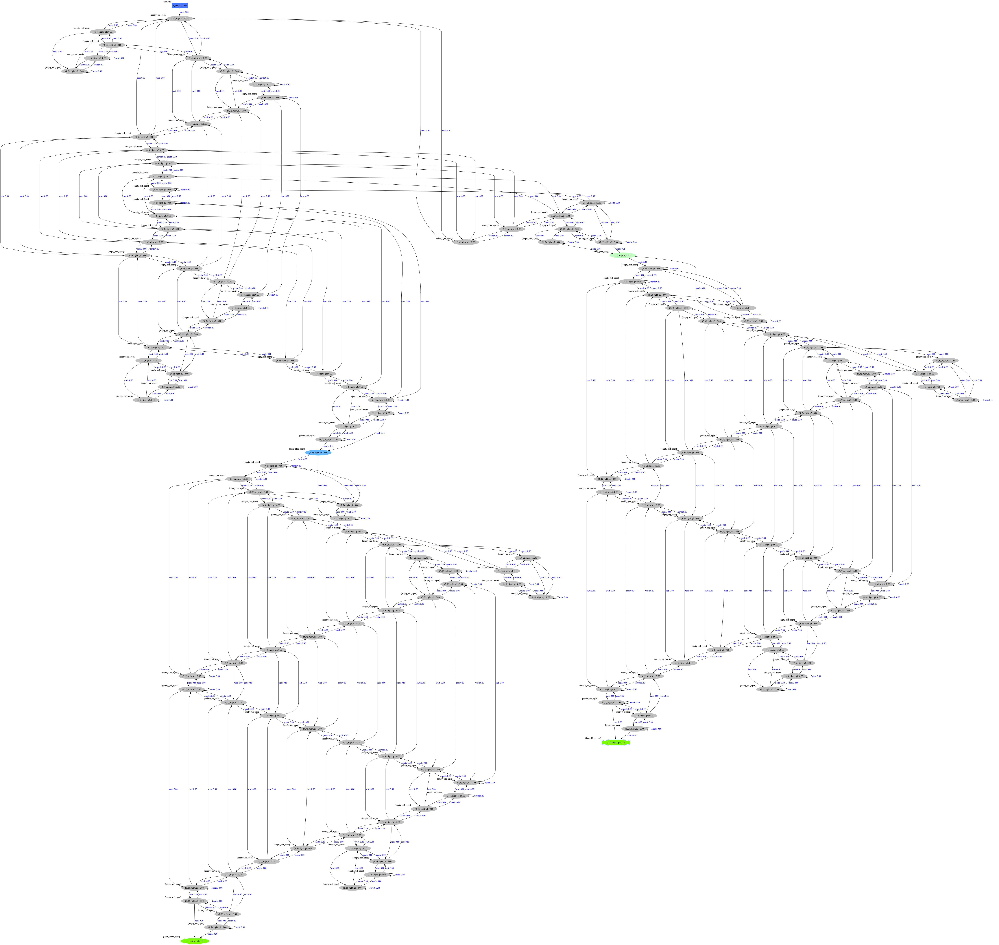

In [7]:
product = active_automata.get(automaton_type='Product',
                              graph_data=(minigrid_TS,
                                          pdfa_specification),
                             show_steps=False)
product.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'model','product']))

A normal product automaton CANNOT project the valid transition probability distributions from the specification onto itself, so ONLY for sampling traces from the product, we normalize the transition distribution in the product.

While this changes the probability value associated with output strings sampled from the product different than when producing a run in the specification under the output string, the *relative frequencies* of the output strings of the product and of the specification will be the same.

This means that sampling on the normalized product will produce corpuses of output strings consistent in relative frequency with the specification's language distribution when projected on the transition system dynamics of the system being specified.

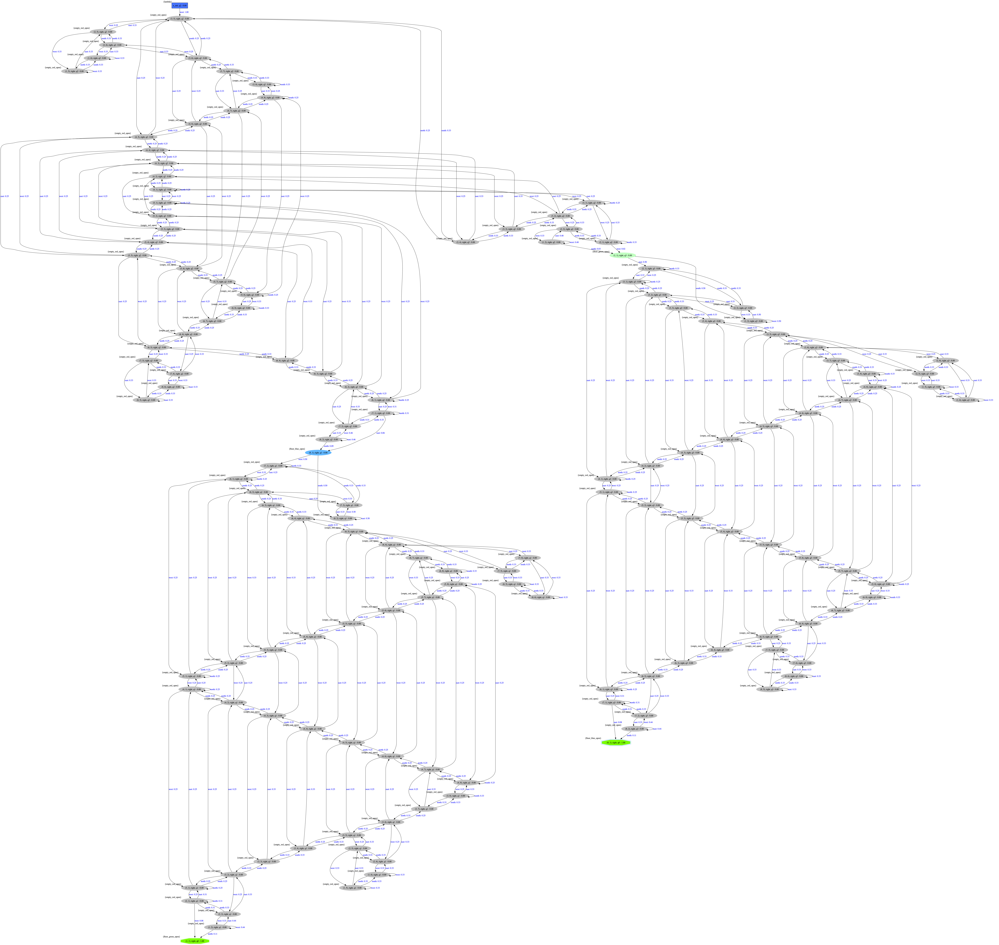

In [8]:
normalized_product = active_automata.get(automaton_type='Product',
                                         graph_data=(minigrid_TS,
                                                     pdfa_specification),
                                         normalize_trans_probabilities=True)
normalized_product.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'model', 'norm',
                                  'product']))

### Generating and Saving Behavioral Demonstrations

To generate demonstration runs on the product that have the the same projected probability as those from the specification, we need to sample strings from the product. This is not straightforward, as the product does not have a valid probability distribution at each state. Thus, we can employ multiple techniques:

<br>

* We can use the `BMPS_exact` algorithm, but instead of returning only the first viable string, we can choose to have it return the top N strings. This has the downside of favoring sampling only the N highest / lowest probability strings in the product, based on whether you are using a max / min heap to keep track of search strings. Thus we can augment `BMPS_exact` samples by enforcing that sampled strings each have different gerneration probability, and by searching using both a min and max heap simultaneously to act as a kind of bidirectional search. These samples will be more characteristic of different prefernces encoded in the specification; when the `BMPS_exact` properties are set properly, this type of sampling can return very good examples of different preferred behaviors.

<br>

* We can use the `SWDFA_MPS`

<br>

* We can also normalize the transition distributions, as discussed above, and sample the trajectories using normal MC sampling. This is very sample inefficient, but will lead to samples with much more diversity. Whether or not samples generated this way preserve the projection of the specification on the dynamics is unclear, but any preferences in the task specification *should* be maintained, which is really the only point of the probabilities.

In [9]:
def eval_sampled_traces(traces, record_video=True):
    if traces is None:
        return
    
    output_strings = []
    for controls, length, prob in zip(*traces):
        if controls is None:
            continue
        output_string, _, video_path = minigrid_TS.run(
            controls,
            record_video=record_video,
            overwrite_old_video=record_video)
        output_strings.append(output_string)
        
        if record_video:
            print(pdfa_specification.cross_entropy_approx(output_string))
            print(prob)
            print(length)
        
        if record_video:
            v = Video(video_path, embed=True,
                      html_attributes="controls muted autoplay loop")
            display(v)
        
    return output_strings

Looking at the exact MPS of the product will help us to choose settings for our sampler:

In [10]:
(MPS_controller,
 prob_of_controls_under_spec) = product.compute_strategy()

print('Minimum sampled string length:', len(MPS_controller))
print('Maximum trace probability:', prob_of_controls_under_spec)


Minimum sampled string length: 16
Maximum trace probability: 0.001055531162664961


Settings for sampling:

In [11]:
N = 25
min_string_probability = 0.0001
num_samples = 50

Monte Carlo Sampling of the normalized product. We will need to do a LOT of resampling, growing with the size of the product, if we want to find strings with prob > 0.

In [14]:
MC_samples = normalized_product.generate_traces(
    num_samples=num_samples,
    N=int(N * 1.5),
    max_resamples=40_000,
    complete_samples=False,
    force_MPS_sampler=False)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    1.5s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    9.7s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:   17.4s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:   18.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:   23.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:   23.8s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:   26.7s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:   33.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:   33.8s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:   35.2s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:   41.1s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:   42.4s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:   59.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:  1.1min
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:  

Visualize the sampled traces:

In [15]:
MC_samples_output_strings = eval_sampled_traces(MC_samples)

0.6552614282206957
5.125466432206674e-11
17


0.49852959485851606
1.996634953308532e-14
24


0.48544800226806023
4.281998980747464e-16
26


0.5441503171095845
1.1824095477865759e-16
26


0.5288246466115002
9.533900352924863e-17
28


0.47417076727628793
7.41115208206292e-17
28


0.4690960115299904
3.385189559769569e-17
29


0.5094280948873623
1.1820660675637137e-17
31


0.5219280948873624
1.897051600837089e-17
29


0.5094280948873623
1.834063559403045e-18
31


0.5288246466115002
4.178226046265063e-17
28


0.46434865938022823
4.391793826407655e-17
30


0.46434865938022823
4.668220896902658e-18
30


0.49839868312265645
8.2308266330202025e-19
33


0.5154764819841364
8.941059852089847e-18
30


0.5154764819841364
1.2394797258539955e-18
30


0.49335666631593367
4.749818669023376e-19
34


0.5094280948873623
6.869981105912093e-18
31


0.4690960115299904
1.04244776538907e-17
29


0.5094280948873623
1.6422354830369108e-18
31


0.4480720234381864
3.3706697516087917e-20
34


0.4598980167398261
5.961711076571479e-19
31


0.5219280948873624
2.3684040822210453e-17
29


0.5037462767055441
5.674407727898321e-19
32


0.5037462767055441
1.1914201930463078e-18
32


0.488594761554029
6.974869868898676e-22
35


0.4445680254228857
8.016935216471779e-19
35


0.488594761554029
9.301223911322736e-21
35


0.5094280948873623
6.269272687447069e-19
31


0.4445680254228857
1.0518893943635118e-20
35


0.4480720234381864
3.21664586895092e-20
34


0.488594761554029
2.160826688527869e-21
35


0.49839868312265645
1.708732545475584e-19
33


0.49839868312265645
4.8359097757697486e-20
33


0.5037462767055441
3.5275752908127697e-19
32


0.4445680254228857
4.9195760348661133e-20
35


0.4690960115299904
5.9787445367902565e-18
29


0.5037462767055441
1.3685295691974256e-19
32


0.45571711001702425
1.7991592356081788e-19
32


0.4445680254228857
7.78455104729833e-21
35


0.5037462767055441
5.592577476698759e-20
32


0.4445680254228857
2.1803965258632566e-22
35


0.4480720234381864
1.0944735502372429e-21
34


0.5037462767055441
1.572912415321526e-20
32


0.5037462767055441
4.398429022590522e-19
32


0.4445680254228857
3.839660746290289e-20
35


0.5094280948873623
9.833176571890746e-18
31


0.49335666631593367
1.537318256818484e-21
34


0.4517821389837988
8.4597201609005e-20
33


0.49839868312265645
1.6738604527107767e-19
33


Sampling using the modified `BMPS_exact` sampler. This will produce samples with much less diversity, but much more consistency with the original specification.

In [16]:
bmps_samples = product.generate_traces(
    num_samples=num_samples,
    N=N,
    min_trace_probability=min_string_probability,
    num_traces_to_find=5,
    complete_samples=True,
    use_greedy_MPS_sampler=False)

Visualize the sampled traces:

In [17]:
BMPS_samples_output_strings = eval_sampled_traces(bmps_samples)

0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6748692713579505
0.00035184372088832035
16


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6969280948873623
0.0004398046511104004
15


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.6552614282206957
0.0002814749767106563
17


0.6748692713579505
0.00035184372088832035
16


0.6552614282206957
0.0002814749767106563
17


0.594655367614635
0.00011529215046068484
21


0.6076423806016479
0.00014411518807585605
20


0.594655367614635
0.00011529215046068484
21


0.6219280948873624
0.00018014398509482005
19


0.6076423806016479
0.00014411518807585605
20


0.6552614282206957
0.0002814749767106563
17


0.594655367614635
0.00011529215046068484
21


0.6076423806016479
0.00014411518807585605
20


0.6552614282206957
0.0002814749767106563
17


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


0.594655367614635
0.00011529215046068484
21


0.6219280948873624
0.00018014398509482005
19


0.6219280948873624
0.00018014398509482005
19


0.6748692713579505
0.00035184372088832035
16


0.594655367614635
0.00011529215046068484
21


0.6552614282206957
0.0002814749767106563
17


0.6552614282206957
0.0002814749767106563
17


0.6552614282206957
0.0002814749767106563
17


0.6219280948873624
0.00018014398509482005
19


0.6748692713579505
0.00035184372088832035
16


0.6748692713579505
0.00035184372088832035
16


Sampling using the `SWDFA_MPS` sampler. This will produce samples with much less diversity, but with the best possible consistency with the original specification.

In [18]:
SWDFA_MPS_samples = product.generate_traces(
    num_samples=5,
    complete_samples=True,
    use_greedy_MPS_sampler=True)

Visualize the sampled traces:

In [19]:
SWDFA_MPS_samples_output_strings = eval_sampled_traces(SWDFA_MPS_samples, 
                                                       record_video=True)

0.5816361830802355
0.001055531162664961
16


0.5816361830802355
0.001055531162664961
16


0.7504995234587908
0.0006871947673600005
13


0.7504995234587908
0.0006871947673600005
13


0.5816361830802355
0.001055531162664961
16


## Learning the Specification

Now that we have generated traces, we can create training / test data for learning with `flexfringe` and then for evaluating in `wombats`.

### Creating Training / Test Datasets

We need to learn a specification over state observations, not over control signals, so we use the ouput words from runs of the sampled controls on the original TS as the sampled traces to feed the learning algorithm:

In [21]:
traces = SWDFA_MPS_samples_output_strings

train_data_file = pdfa_specification.write_traces_to_file(
    traces,
    file=LEARNING_TRAIN_DATA_REL_FILEPATH)

### Learning with `Flexfringe`

In [24]:
flexfringe = FlexfringeInterface(output_directory=LEARNER_DATA_DIR)
flexfringe.infer_model(get_help=True)

no learning options specified, printing tool help:
welcome, running git commit d1cf04ada0831d0605a3651971ef9a02091d8823 with: dfasat/flexfringe --help  
Usage: flexfringe [OPTIONS]* [input dfa file]
      --version                   Display version information
  -V, --debug=integer             Debug mode and verbosity evel
  -o, --output-dir=string         Relative path for output files with trailing
                                  /, default: "./".
  -h, --heuristic-name=string     Name of the merge heurstic to use; default
                                  count_driven. Use any heuristic in the
                                  evaluation directory. It is often beneficial
                                  to write your own, as heuristics are very
                                  application specific.
  -d, --data-name=string          Name of the merge data class to use; default
                                  count_data. Use any heuristic in the
                                 

welcome, running git commit d1cf04ada0831d0605a3651971ef9a02091d8823 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=1 -x=0 -w=0 -a=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -p=0.8 --output-dir=experiments/MiniGrid_learning_from_product_samples/flexfringe_data/dfa /Users/nicholasrenninger/Google Drive/Grad School/specification learning/code/DPFA_DTS_product_experiment/dfasatInvestigations/experiments/MiniGrid_learning_from_product_samples/flexfringe_data/MiniGrid_learning_from_product_samples_train 
sat_program : 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running m99957  m99975  x10  m99931  x3 

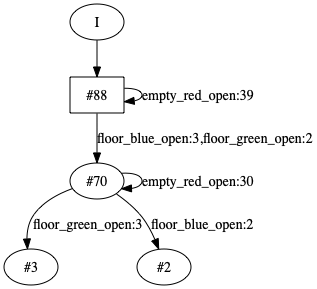

In [26]:
flexfringe.infer_model(training_file=train_data_file,
                       h='kldistance',
                       d='kl_data',
                       n='1',
                       x='0',
                       w='0',
                       a='0',
                       b='1',
                       f='1',
                       I='0',
                       t='1',
                       l='0',
                       q='0',
                       y='0',
                       p='0.8')

# flexfringe.draw_initial_model()
flexfringe.draw_learned_model()

loading into `wombats`:

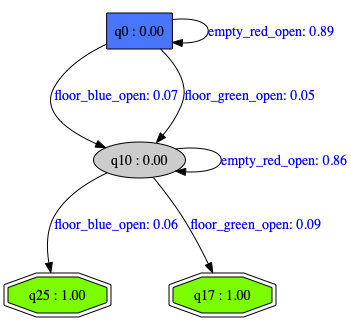

In [27]:
learned_fdfa = active_automata.get(automaton_type='FDFA',
                                   graph_data=flexfringe,
                                   graph_data_format='learning_interface')
learned_pdfa = active_automata.get(automaton_type='PDFA',
                                   graph_data=learned_fdfa,
                                   graph_data_format='fdfa_object',
                                   smooth_transitions=False,
                                   smoothing_amount=0.0000)
learned_pdfa.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'learned', 'PDFA']))

## Computing the Most-Probable, Possible Controller

We see here that the most probable string is not the same when applying the learned model to the dynamics. This is a good demonstration of the fundamental limit of trying to learn multiple preferences from demonstrations on an environment. This is clearly different than learning from demonstrations of the dynamics-free specification, and evident of a need to provide / process demonstrations using multiple layers of abstraction of the dynamical system.

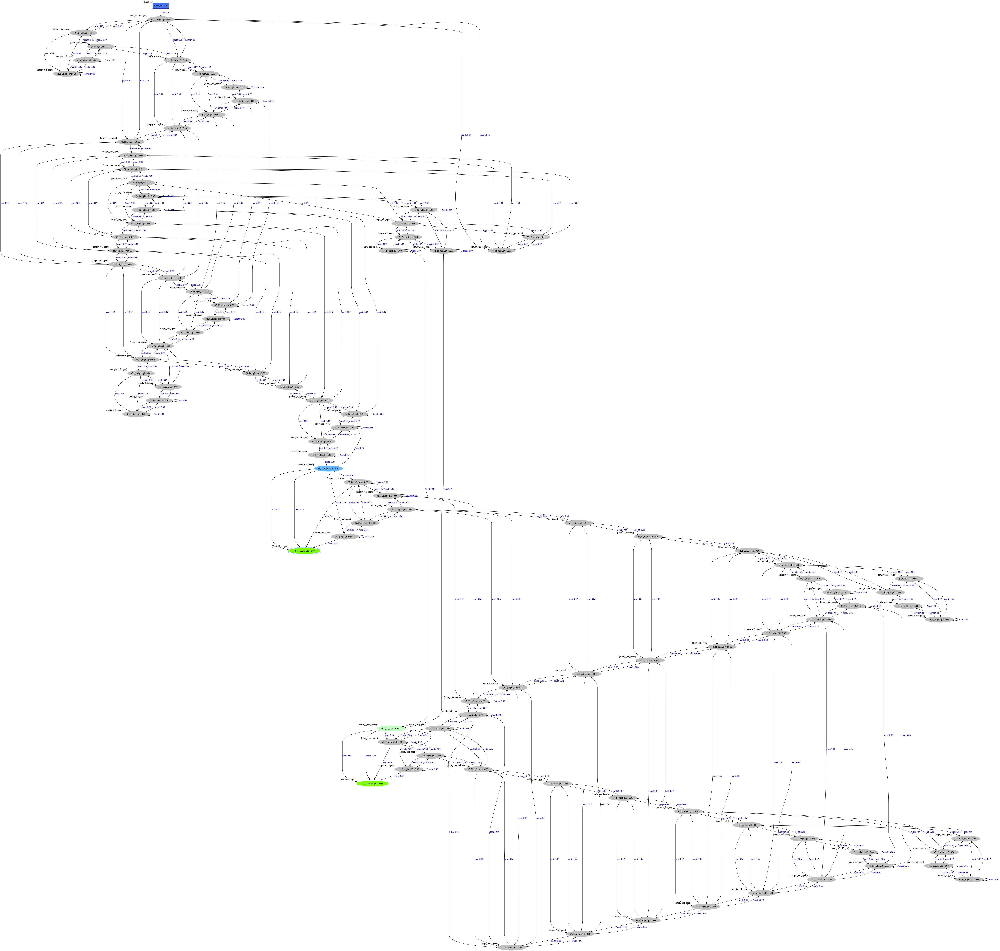


Optimal Controls: ['north', 'north', 'north', 'west', 'west', 'north', 'west']
Probability of Generated TS Observations in Spec: 0.0018893051690821706
['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_green_open']
['(3, 5), right', '(3, 4), right', '(3, 3), right', '(3, 2), right', '(2, 2), right', '(1, 2), right', '(1, 1), right', '(1, 1), right']


In [28]:
learned_product = active_automata.get(automaton_type='Product',
                                      graph_data=(minigrid_TS,
                                                  learned_pdfa),
                                      show_steps=False)
learned_product.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'learned', 'product']))
learned_product.observations

(controls, prob_of_controls_under_spec) = learned_product.compute_strategy()

print(f'Optimal Controls: {controls}')
print(f'Probability of Generated TS Observations in Spec: ' +
      f'{prob_of_controls_under_spec}')

output_string, visited_states, video_path = minigrid_TS.run(controls,
                                                            record_video=True)
print(output_string)
print(visited_states)
Video(video_path, embed=True, html_attributes="controls muted autoplay loop")